In [1]:
%cd /Users/santiago/thesis/code
import numpy as np
from src import utils, kmeans, dba
import matplotlib.pyplot as plt

/Users/santiago/thesis/code


In [2]:
cbf = 'CBF' # 3 classes, 30 sequences, seq_len 128
faceall = 'FaceAll' # 14 classes, 560 sequences, seq_len 131
DATASET = cbf

S, classes = utils.get_n_sequences(cbf)

k = len(classes)
n_seqs = S.shape[0]
seq_len = S.shape[1]

print(f'Classes: {k}\nSequences: {n_seqs}\nSequence length: {seq_len}')

Classes: 3
Sequences: 30
Sequence length: 128


In [3]:
clusters, centroids = kmeans.find_k_clusters(S, k, verbose=True)


[k-means] Iteration 1...
[k-means] Assigning sequences to nearest centroids...
[k-means] Recalculating centroids...

[k-means] Iteration 2...
[k-means] Assigning sequences to nearest centroids...
[k-means] Recalculating centroids...

[k-means] Iteration 3...
[k-means] Assigning sequences to nearest centroids...
[k-means] Recalculating centroids...

[k-means] Iteration 4...
[k-means] Assigning sequences to nearest centroids...
[k-means] Recalculating centroids...

[k-means] Done.


### Clusters by algorithm

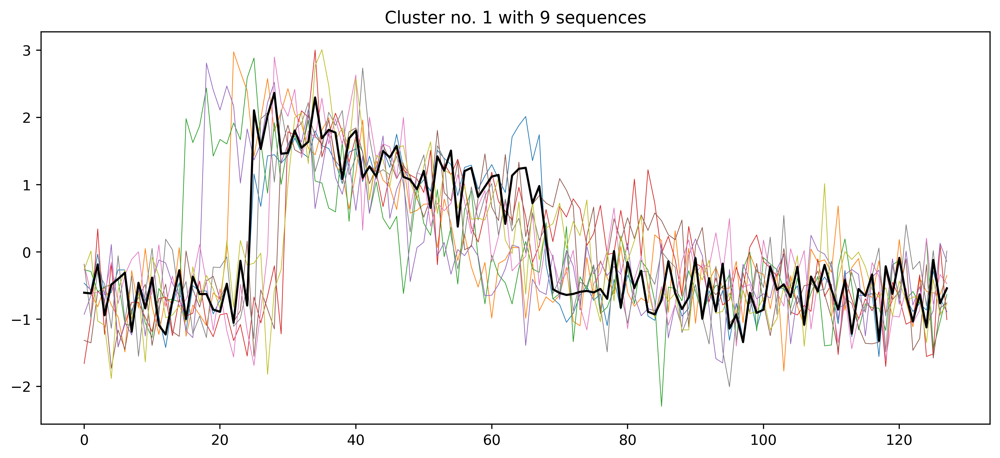

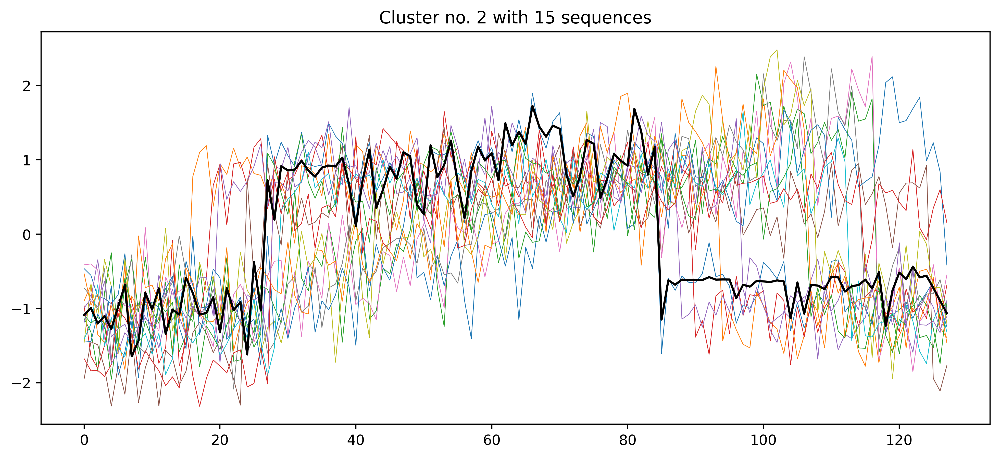

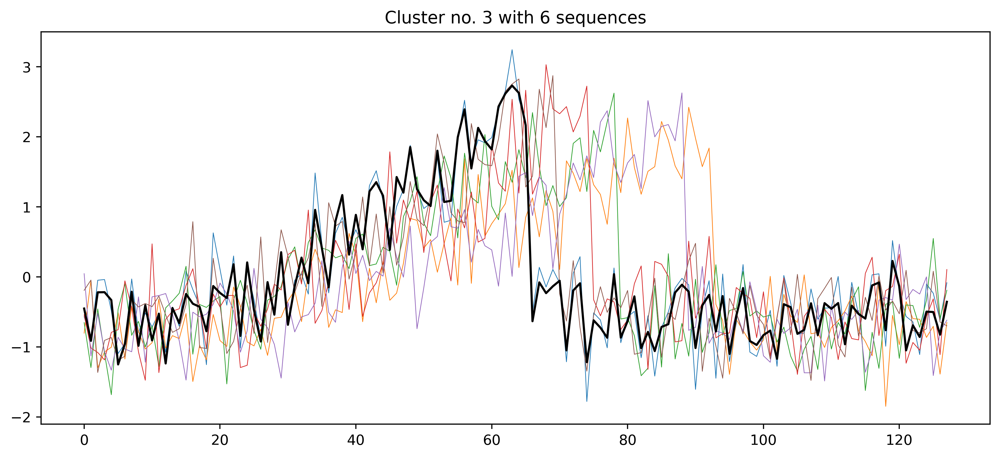

In [4]:
clusters = utils.extract_class_sequences(S, clusters)
utils.plot_clusters(clusters, centroids)

### Classes by dataset

In [5]:
# Perform DBA on classes, as specified in dataset

c_means = []
c_sequences = []
for class_indices in classes:
    # extract class sequences from entire set
    c_S = np.take(S, class_indices, axis=0)
    mean = dba.dba_mean(c_S)
    c_means.append(mean)
    c_sequences.append(c_S)

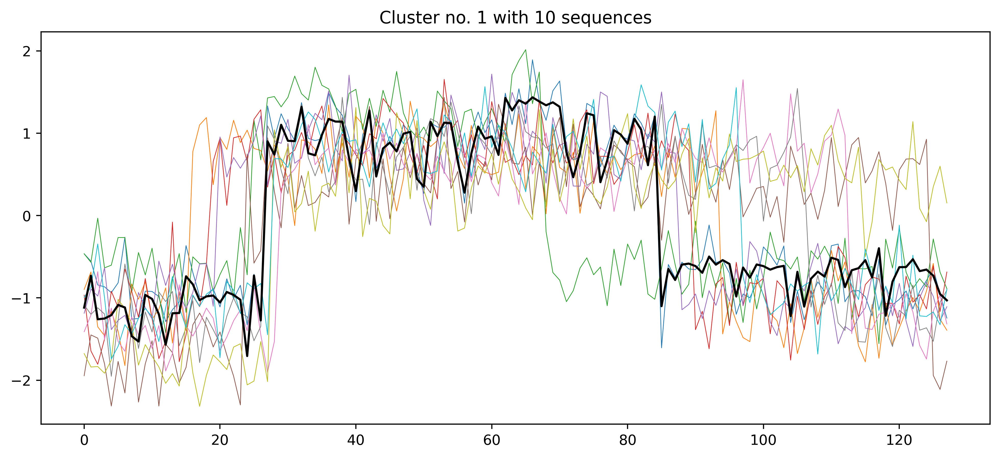

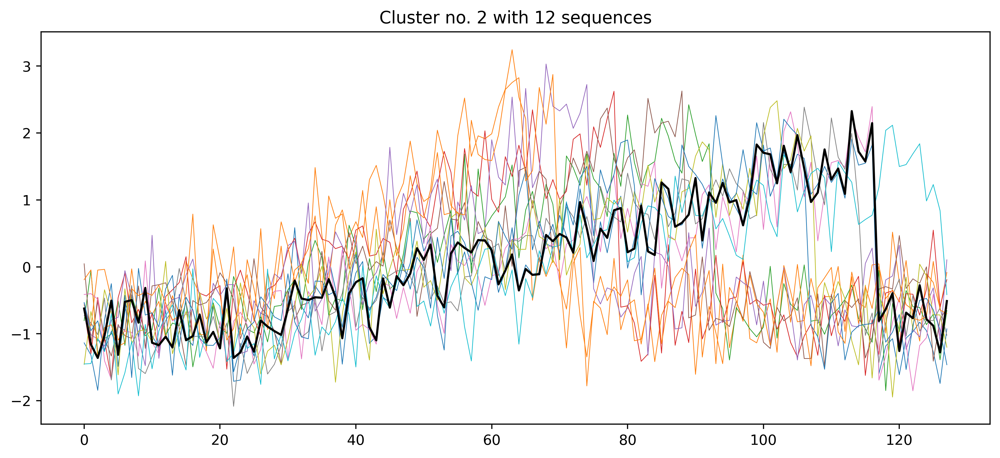

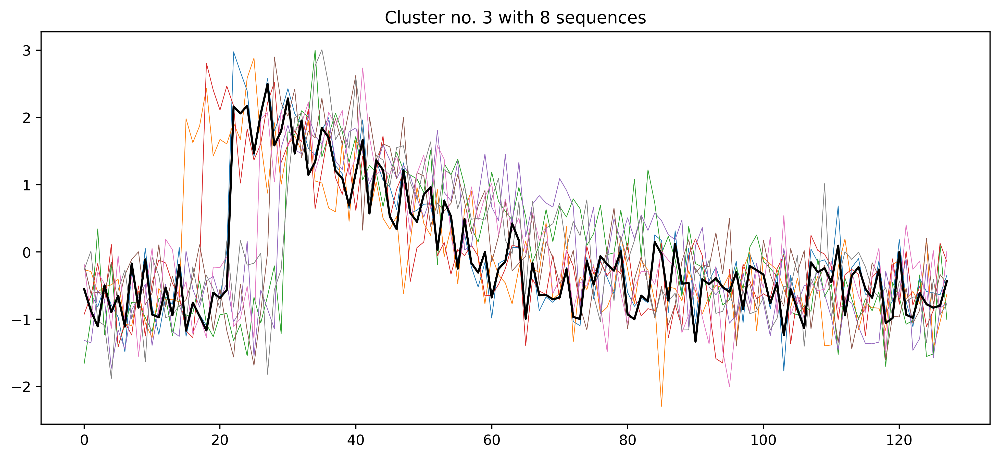

In [6]:
utils.plot_clusters(c_sequences, c_means)